In [ ]:
!pip install kaleido

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 79.9 MB 1.2 MB/s 


In [ ]:
import os
import random 
import datetime
import numpy as np
import pandas as pd 
import tensorflow as tf
import plotly.io as pio
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go


from PIL import Image
from numba import cuda
from keras.applications.mobilenet import MobileNet
from tensorboard.plugins.hparams import api as hp
from sklearn.model_selection import train_test_split

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Data Insigths

In [ ]:
directory = '/content/drive/MyDrive/Age_Data/data'
age_df = pd.DataFrame(columns = ["Label", "Photo path"])

for dir in os.listdir(directory):
    label_dir = os.path.join(directory, dir)
    for f in os.listdir(label_dir):
        photo = os.path.join(label_dir, f)
        if os.path.isfile(photo):
            row = [dir, photo]
            age_df.loc[len(age_df)] = row 
age_df = age_df.sort_values(by = "Label")

In [ ]:
fig = px.histogram(age_df, x="Label")
fig.update_layout(title = "Distribution of classes in dataset")
fig.show()
pio.write_image(fig, '/content/drive/MyDrive/Age_Data/distribution_plot.png', scale=6, width = 1000, height = 600)

In [ ]:
classes_no = len(age_df['Label'].unique())
classes_no

99

## Data Preprocessing and Train/Val/Test Split

In [ ]:
def generate_pixels_from_png(df):
    df['Pixels'] = [Image.open(path) for path in df['Photo path']]
    df['Pixels'] = [image.convert('RGB') for image in df['Pixels']]
    df['Pixels'] = [np.array(image)/255 for image in df['Pixels']]
    return df

In [ ]:
tmp = generate_pixels_from_png(age_df)

Start
First step done
Second steo done
Third step done


In [ ]:
# Train, validation and testing split 
test_size = 0.02
seed = 42
X_train, X_test, Y_train, Y_test = train_test_split(age_df['Pixels'].to_list(), 
                                                    age_df['Label'].to_list(),
                                                    test_size=test_size, 
                                                    random_state=seed,
                                                    shuffle=True)

X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.2)

In [ ]:
# save to files
# np.save('/content/drive/MyDrive/Age_Data/X_train.npy', X_train)
# np.save('/content/drive/MyDrive/Age_Data/Y_train.npy', Y_train)
# np.save('/content/drive/MyDrive/Age_Data/X_val.npy', X_val)
# np.save('/content/drive/MyDrive/Age_Data/Y_val.npy', Y_val)
# np.save('/content/drive/MyDrive/Age_Data/X_test.npy', X_test)
# np.save('/content/drive/MyDrive/Age_Data/Y_test.npy', Y_test)

## Model Building

In [ ]:
X_train = np.load('/content/drive/MyDrive/Age_Data/X_train.npy')
Y_train = np.load('/content/drive/MyDrive/Age_Data/Y_train.npy')
X_val = np.load('/content/drive/MyDrive/Age_Data/X_val.npy')
Y_val = np.load('/content/drive/MyDrive/Age_Data/Y_val.npy')
X_test = np.load('/content/drive/MyDrive/Age_Data/X_test.npy')
Y_test = np.load('/content/drive/MyDrive/Age_Data/Y_test.npy')

Photo of person age 1.0


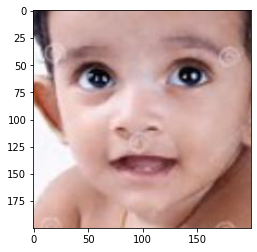

In [ ]:
#Read photo and pixels
print(f"Photo of person age {Y_train[2]}")
plt.imshow(X_train[2])

In [ ]:
def plot_photos_predictions(model, X, Y, range_start, range_end):
  prediction = model.predict(X[range_start:range_end])
  fig, m_axs = plt.subplots(int((range_end-range_start)/2), 2, figsize = (16, 32))

  for i, ax in zip(range(range_start,range_end), m_axs.flatten()):
    ax.imshow(X[i])
    ax.set_title('Age: %2.1f\nPredicted Age: %2.1f' % (Y[i], prediction[i-range_start]))
    ax.axis('off')


In [ ]:
def compare_amount_of_good_predictions(model, X, Y, age_diff_treshold=5):
  prediction = model.predict(X)
  prediction = [x[0] for x in prediction]
  df = pd.DataFrame(columns = ['Real Age', 'Predicted Age'])
  df['Real Age'] = pd.Series(Y_test)
  df['Predicted Age'] = pd.Series(prediction)
  df['Age differences'] = [abs(df.at[x,'Real Age'] - df.at[x,'Predicted Age']) for x in range(0,len(df))]
  df['Age diff bigger than x'] = [1 if df.at[x,'Age differences']>age_diff_treshold else 0 for x in range(0,len(df))]
  final_df = pd.DataFrame(columns = ['Total samples', 'Not accurate samples', 'Accurate samples'])
  final_df['Total samples'] = df.groupby('Real Age').count()['Predicted Age']
  final_df['Not accurate samples'] = df.groupby('Real Age').sum()['Age diff bigger than x']
  final_df['Accurate samples'] = [final_df.at[x,'Total samples']-final_df.at[x,'Not accurate samples'] for x in final_df.index]
  return final_df

In [ ]:
def run(hparams, log_dir):

  with tf.summary.create_file_writer(log_dir).as_default():
    hp.hparams_config(
      hparams=[HP_ALPHA, HP_DEPTH_MULTI, HP_DROPOUT, HP_POOLING],
      metrics=[hp.Metric(METRIC_MEAN_ABSOLUTE_ERROR, display_name='Mean Absolute Error')],
    )
  
  mobilenet_baseline = MobileNet(input_shape=(200, 200, 3),
                                 include_top=False,
                                 alpha=hparams[HP_ALPHA],
                                 depth_multiplier=hparams[HP_DEPTH_MULTI], 
                                 dropout=hparams[HP_DROPOUT],
                                 pooling=hparams[HP_POOLING])

  mobilenet = tf.keras.Sequential()
  mobilenet.add(mobilenet_baseline)
  mobilenet.add(tf.keras.layers.Flatten())
  mobilenet.add(tf.keras.layers.Dense(1,activation='relu')) 

  mobilenet.compile(optimizer = 'adam', loss = 'mean_absolute_error', metrics = ['mean_absolute_error'])


  filepath_checkpoint = os.path.join(MAIN_DIR,'checkpoint/')

  tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
  early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
  model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=filepath_checkpoint,
                                                                save_weights_only=True,
                                                                monitor='val_loss',
                                                                mode='max',
                                                                save_best_only=True)


  mobilenet.summary()

  outcome = mobilenet.fit(X_train, Y_train, epochs=50, validation_data = (X_val, Y_val), callbacks=[tensorboard_callback, 
                                                      early_stopping_callback, 
                                                      model_checkpoint_callback,
                                                      hp.KerasCallback(log_dir, hparams)], batch_size = 32)
  mae = min(outcome.history['val_mean_absolute_error'])
  with tf.summary.create_file_writer(log_dir).as_default():
    tf.summary.scalar(METRIC_MEAN_ABSOLUTE_ERROR, mae, step=1)

  return mobilenet

In [ ]:
def model_load(hparams):
    mobilenet_baseline = MobileNet(input_shape=(200, 200, 3),
                                 include_top=False,
                                 alpha=hparams[HP_ALPHA],
                                 depth_multiplier=hparams[HP_DEPTH_MULTI], 
                                 dropout=hparams[HP_DROPOUT],
                                 pooling=hparams[HP_POOLING])

    mobilenet = tf.keras.Sequential()
    mobilenet.add(mobilenet_baseline)
    mobilenet.add(tf.keras.layers.Flatten())
    mobilenet.add(tf.keras.layers.Dense(1,activation='relu')) 

    mobilenet.compile(optimizer = 'adam', loss = 'mean_absolute_error', metrics = ['mean_absolute_error'])


    filepath_checkpoint = os.path.join(MAIN_DIR,'checkpoint/')

    # Load model weights from file
    mobilenet.load_weights(filepath_checkpoint)
    
    return mobilenet

## Model Training

In [ ]:
MAIN_DIR = '/content/drive/MyDrive/Age_Data/asia_logs'

HP_ALPHA = hp.HParam('alpha', hp.Discrete([1]))
HP_DEPTH_MULTI = hp.HParam('depth_multiplier', hp.Discrete([1]))
HP_DROPOUT = hp.HParam('dropout', hp.Discrete([0.01]))
HP_POOLING = hp.HParam('pooling', hp.Discrete(['avg']))
METRIC_MEAN_ABSOLUTE_ERROR = 'mean_absolute_error'

In [ ]:
for alpha in HP_ALPHA.domain.values:
  for depth in HP_DEPTH_MULTI.domain.values:
    for dropout in HP_DROPOUT.domain.values: 
      for pooling in HP_POOLING.domain.values:
        hparams = {
            HP_ALPHA: alpha,
            HP_DEPTH_MULTI: depth, 
            HP_DROPOUT: dropout, 
            HP_POOLING: pooling
        }
        print({h.name: hparams[h] for h in hparams})
        log_dir = os.path.join(MAIN_DIR,'fit/') + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        print(log_dir)
        mobilenet = run(hparams, log_dir)


In [ ]:
for alpha in HP_ALPHA.domain.values:
  for depth in HP_DEPTH_MULTI.domain.values:
    for dropout in HP_DROPOUT.domain.values: 
      for pooling in HP_POOLING.domain.values:
        hparams = {
            HP_ALPHA: alpha,
            HP_DEPTH_MULTI: depth, 
            HP_DROPOUT: dropout, 
            HP_POOLING: pooling
        }
        mobilenet = model_load(hparams)

17225924/17225924 [==============================] - 1s 0us/step


1/1 [==============================] - 1s 729ms/step


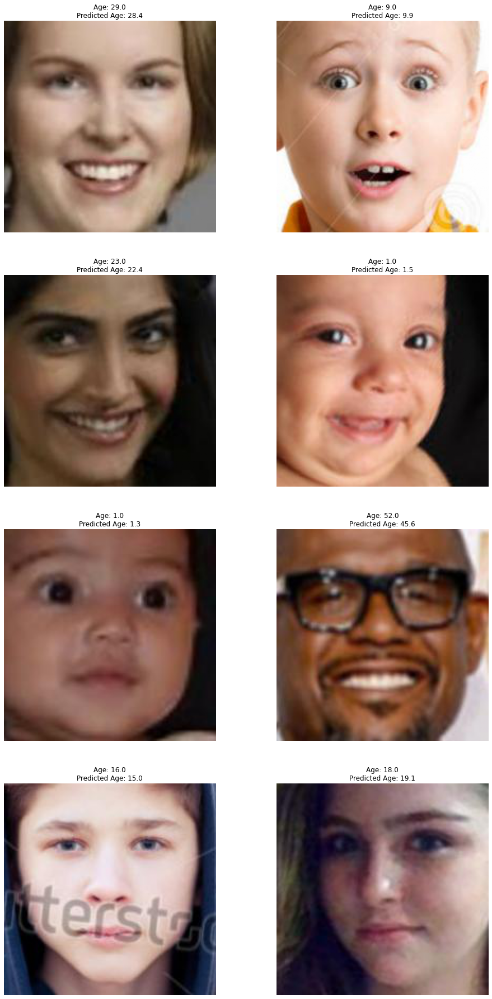

In [ ]:
## Checking predictions on train set
plot_photos_predictions(mobilenet, X_train, Y_train, 8, 16)

1/1 [==============================] - 0s 21ms/step


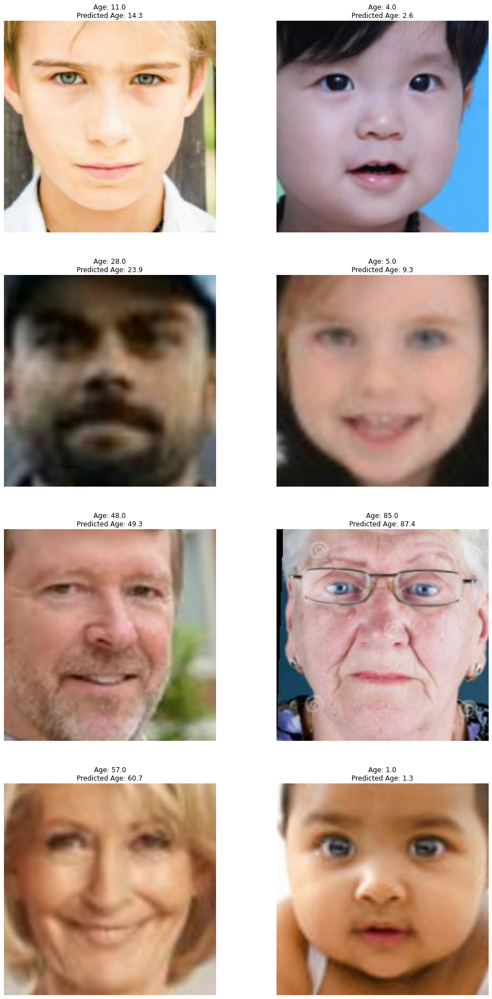

In [ ]:
## Checking predictions on validation set
plot_photos_predictions(mobilenet, X_val, Y_val, 0, 8)

## Tensorboard

In [ ]:
!kill 5372

In [ ]:
%reload_ext tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Age_Data/asia_logs/fit 

<IPython.core.display.Javascript object>

## MODEL TESTS

In [ ]:
output = mobilenet.evaluate(X_test, Y_test)
print(f"The mean average error on the test set is {output[-1]} years")

7/7 [==============================] - 0s 71ms/step - loss: 4.4405 - mean_absolute_error: 4.4405
The mean average error on the test set is 4.440463542938232 years


In [ ]:
final_df = compare_amount_of_good_predictions(mobilenet, X_test, Y_test)
final_df

7/7 [==============================] - 0s 34ms/step


,Total samples,Not accurate samples,Accurate samples
Real Age,,,
1.0,22,0,22
2.0,7,0,7
3.0,4,0,4
4.0,10,0,10
5.0,5,0,5
...,...,...,...
80.0,3,1,2
85.0,2,2,0
86.0,1,0,1


In [ ]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=final_df.index, y=final_df["Not accurate samples"],
    name = "Not accurate samples",
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=final_df.index, y=final_df["Accurate samples"],
    name = "Accurate samples",
    marker_color='green'
))

fig.update_xaxes(title="Age of a person")
fig.update_yaxes(title="Number of samples")


fig.update_layout(barmode='relative', width = 1200)
fig.show()

1/1 [==============================] - 0s 21ms/step


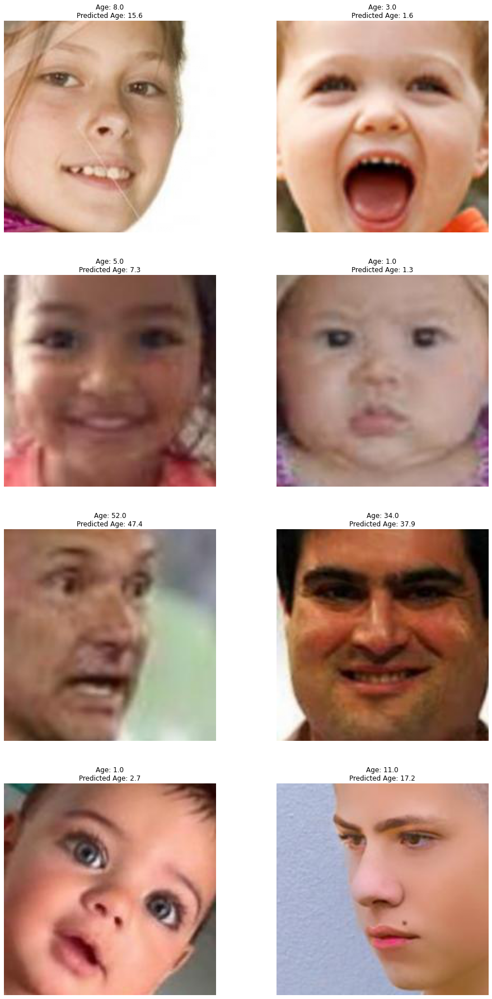

In [ ]:
## Checking predictions on train set
plot_photos_predictions(mobilenet, X_test, Y_test, 0, 8)

## PERSONAL DATA TEST

1/1 [==============================] - 0s 22ms/step
Person on the photo is predicted to be 21.0 years old


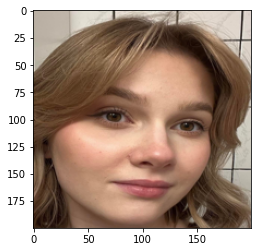

In [ ]:
path_to_check = "/content/domi_test.jpg"
image = Image.open(path_to_check)
image = image.resize((200,200))
immge = image.convert('RGB')
plt.imshow(image)
image = np.array(image)/255

image = np.expand_dims(image,axis=0)
predicted_age = mobilenet.predict(image)
print(f"Person on the photo is predicted to be {round(predicted_age[0][0],0)} years old")